In [1]:
import lfi
import numpy as np
import matplotlib.pyplot as plt
import torch

## NPEC

### D: 30

#### budget: 1_000

In [2]:
np.random.seed(42)
torch.manual_seed(1925)

In [4]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [5]:
budget = 1000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [6]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [7]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [8]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/1000 [00:00<?, ?it/s]

 Neural network successfully converged after 277 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [9]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/nflows/transforms/lu.py:80: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:2192.)
  outputs, _ = torch.triangular_solve(


In [10]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

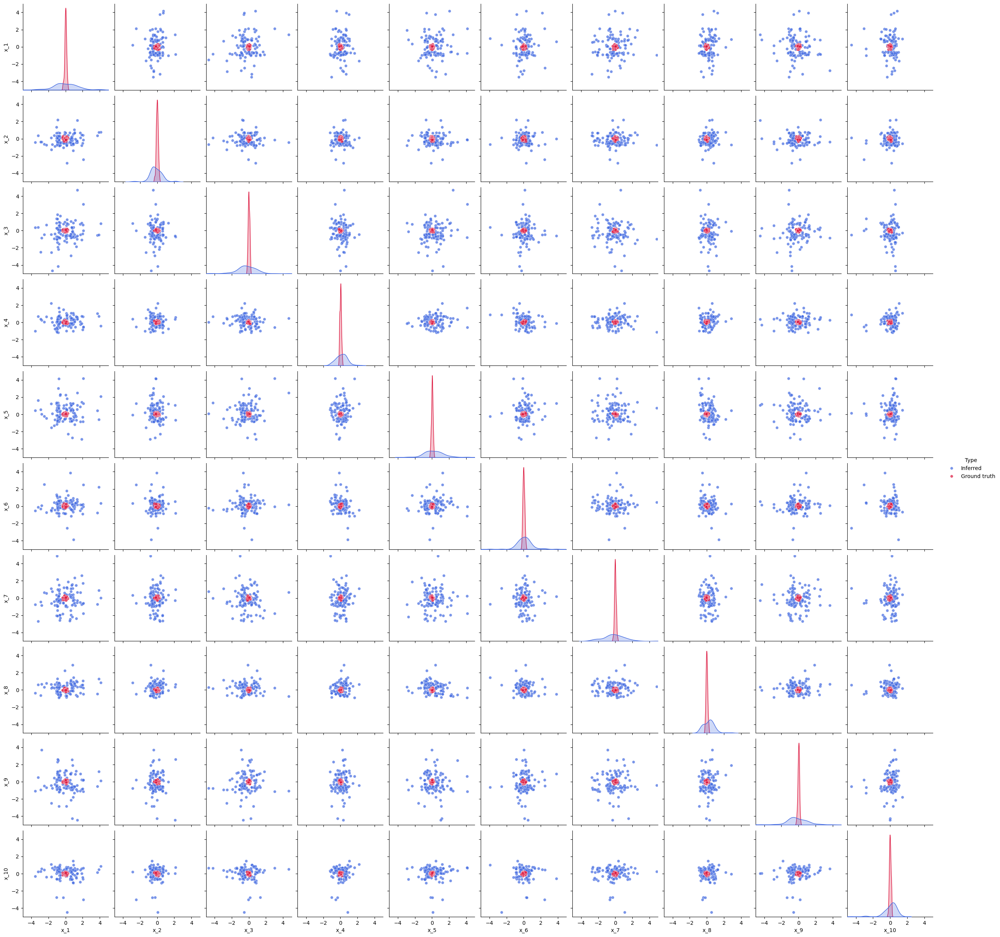

In [11]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [12]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.97


#### budget: 5_000

In [13]:
np.random.seed(42)
torch.manual_seed(1925)

In [14]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [15]:
budget = 5000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [16]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [17]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [18]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/5000 [00:00<?, ?it/s]

 Neural network successfully converged after 139 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [19]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [20]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

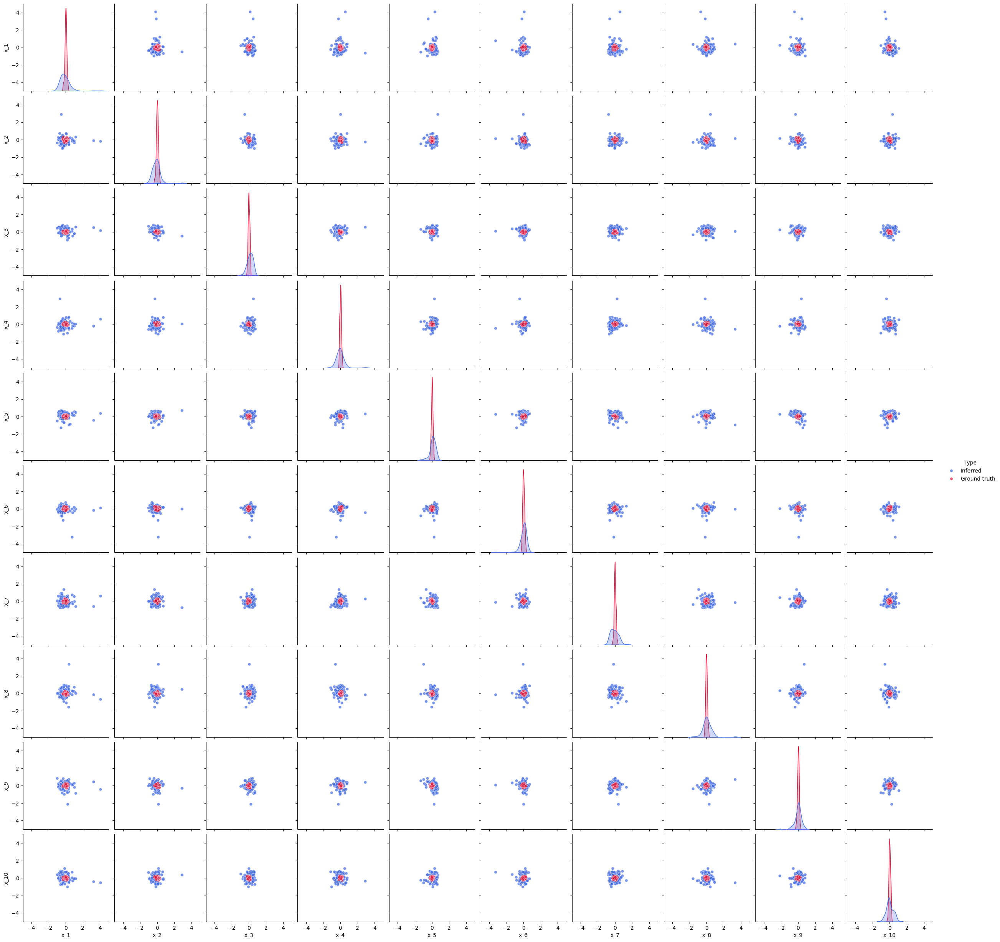

In [21]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [22]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.96


#### budget: 10_00

In [23]:
np.random.seed(42)
torch.manual_seed(1925)

In [24]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [25]:
budget = 10000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [26]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [27]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [28]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/10000 [00:00<?, ?it/s]

 Neural network successfully converged after 129 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [29]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [30]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

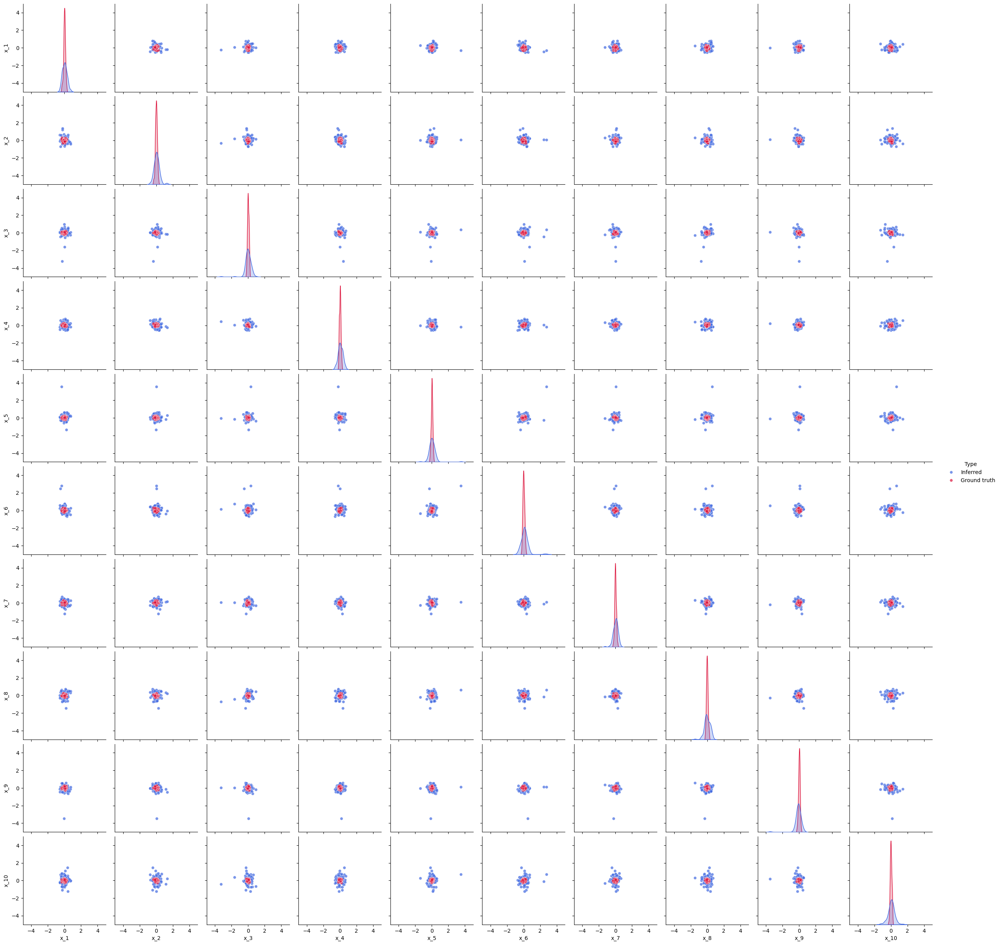

In [31]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [33]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.9349999999999999


#### budget: 50_000

In [34]:
np.random.seed(42)
torch.manual_seed(1925)

In [35]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [36]:
budget = 50000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [37]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [38]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [39]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/50000 [00:00<?, ?it/s]

 Neural network successfully converged after 74 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [40]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [41]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

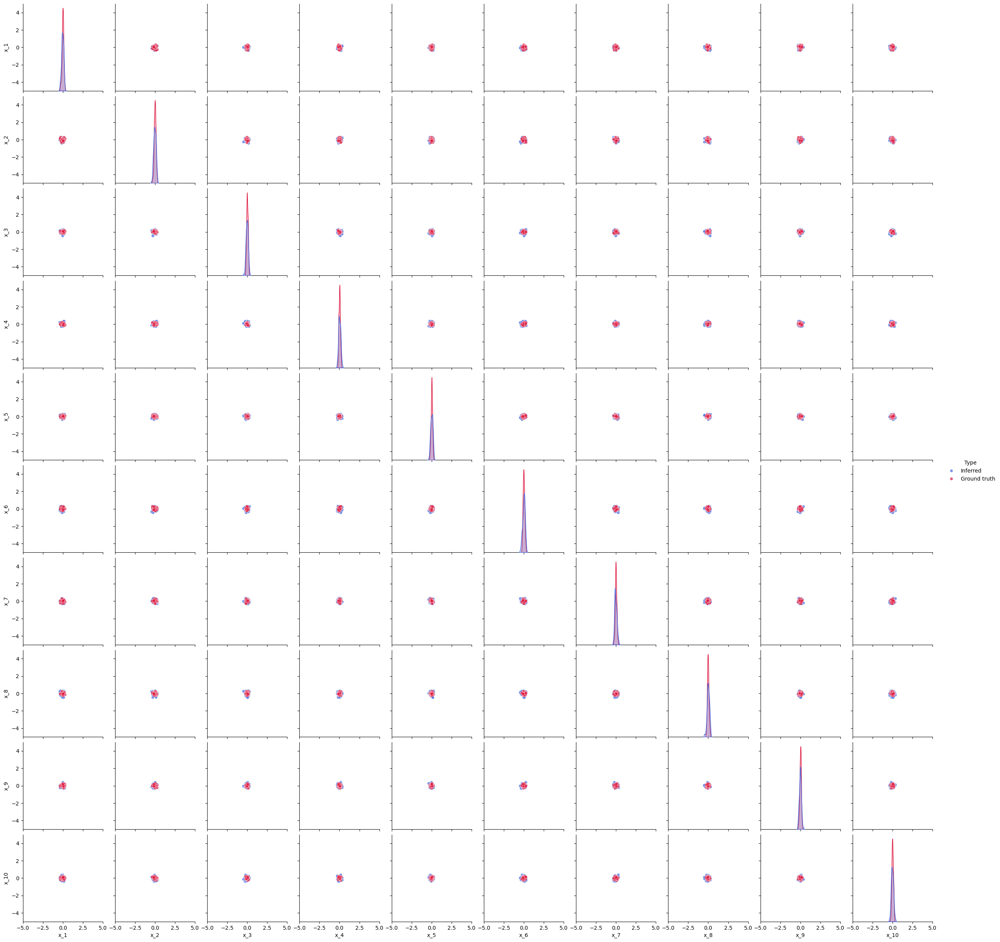

In [42]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [43]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.6749999999999999


#### budget: 100_000

In [44]:
np.random.seed(42)
torch.manual_seed(1925)

In [45]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [46]:
budget = 100000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [47]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [48]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [49]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/100000 [00:00<?, ?it/s]

 Neural network successfully converged after 69 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [50]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [51]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

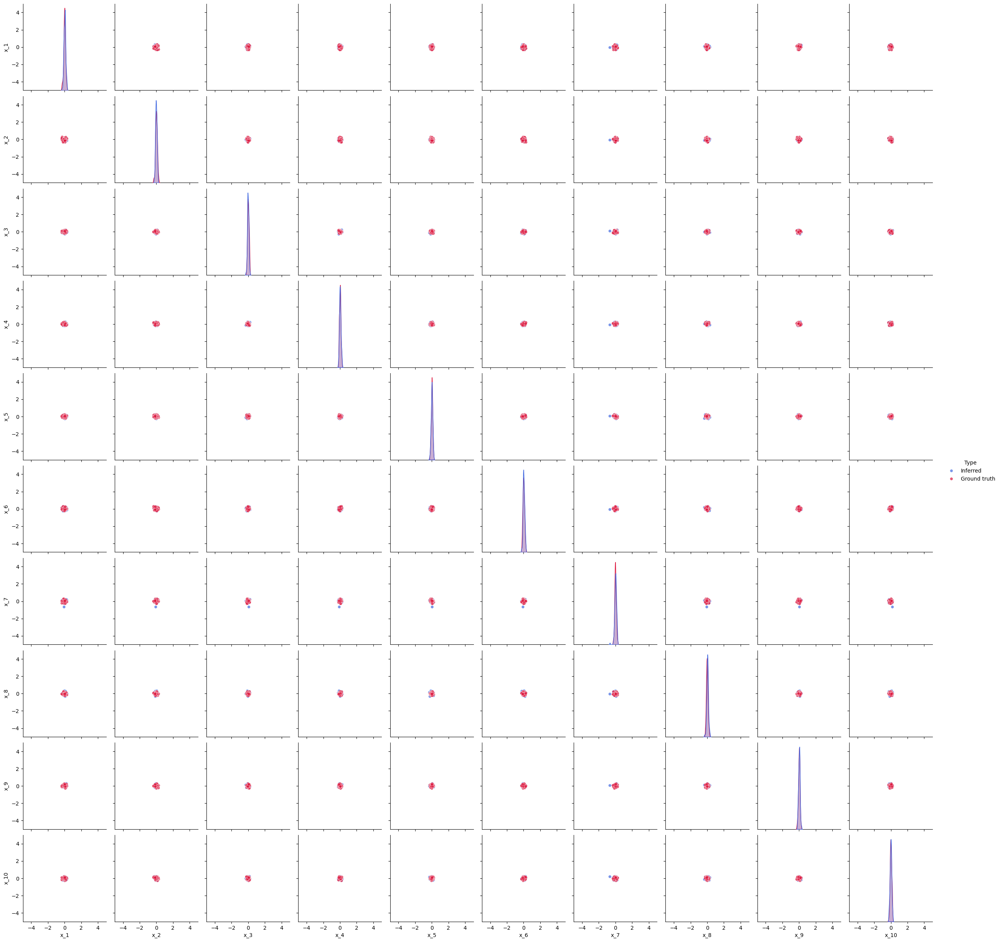

In [52]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [53]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.5599999999999999


### D: 40

#### budget: 1_000

In [54]:
np.random.seed(42)
torch.manual_seed(1925)

In [55]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 40
simulator_sigma_noise = 0.1
simulator_dim_y = 40
observation_nof_obs = 1

In [56]:
budget = 1000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [57]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [58]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [59]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/1000 [00:00<?, ?it/s]

 Neural network successfully converged after 280 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [60]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [61]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

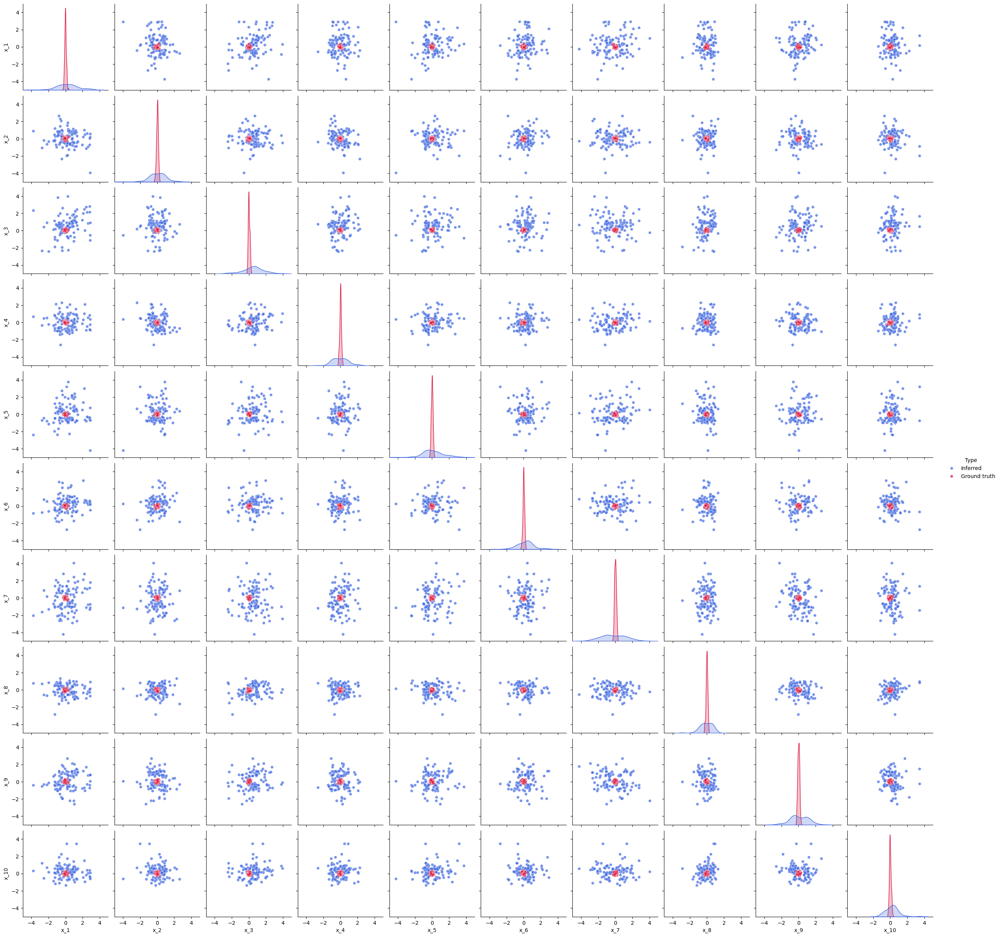

In [62]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [63]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.985


#### budget: 5_000

In [67]:
np.random.seed(42)
torch.manual_seed(1925)

In [68]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 40
simulator_sigma_noise = 0.1
simulator_dim_y = 40
observation_nof_obs = 1

In [69]:
budget = 5000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [70]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [71]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [72]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/5000 [00:00<?, ?it/s]

 Neural network successfully converged after 150 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [73]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [74]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

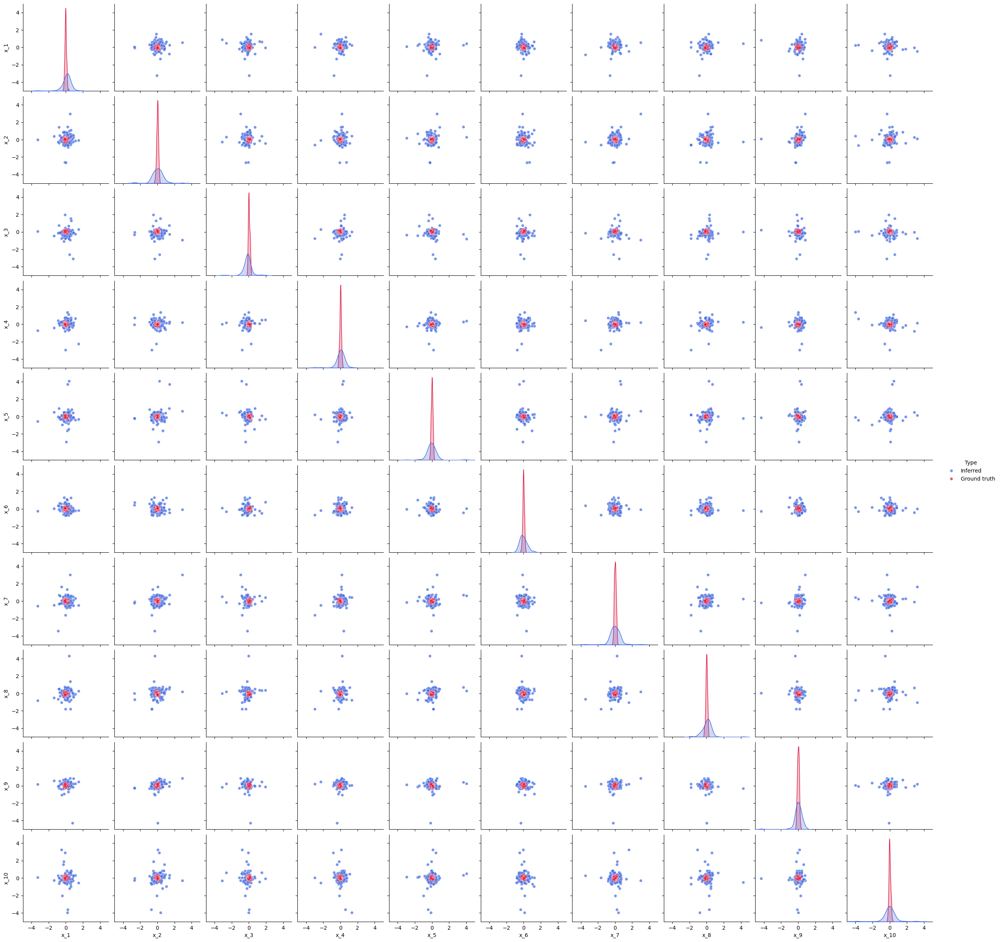

In [75]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [76]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.96


#### budget: 10_000

In [77]:
np.random.seed(42)
torch.manual_seed(1925)

In [78]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 40
simulator_sigma_noise = 0.1
simulator_dim_y = 40
observation_nof_obs = 1

In [79]:
budget = 10000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [80]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [81]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [82]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/10000 [00:00<?, ?it/s]

 Neural network successfully converged after 137 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [83]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [84]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

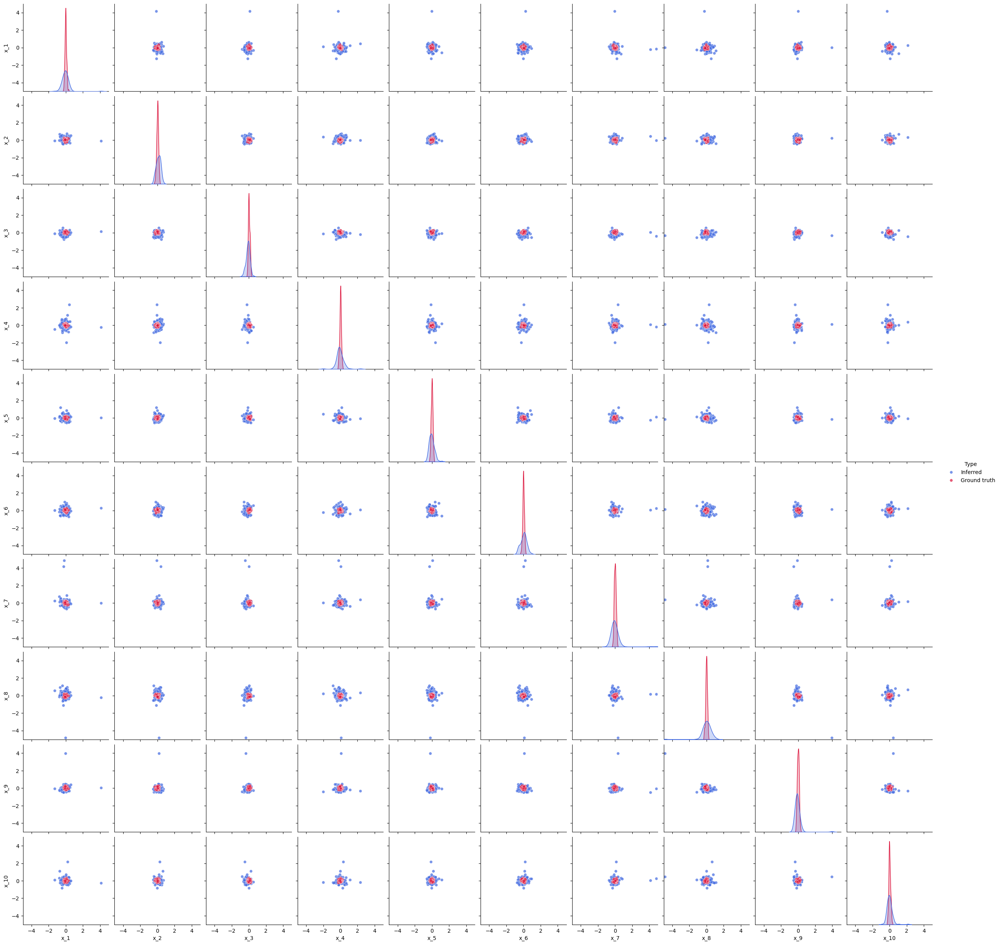

In [85]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [86]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.95


#### budget: 50_000

In [87]:
np.random.seed(42)
torch.manual_seed(1925)

In [88]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 40
simulator_sigma_noise = 0.1
simulator_dim_y = 40
observation_nof_obs = 1

In [89]:
budget = 50000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [90]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [91]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [92]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/50000 [00:00<?, ?it/s]

 Neural network successfully converged after 75 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [93]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [94]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

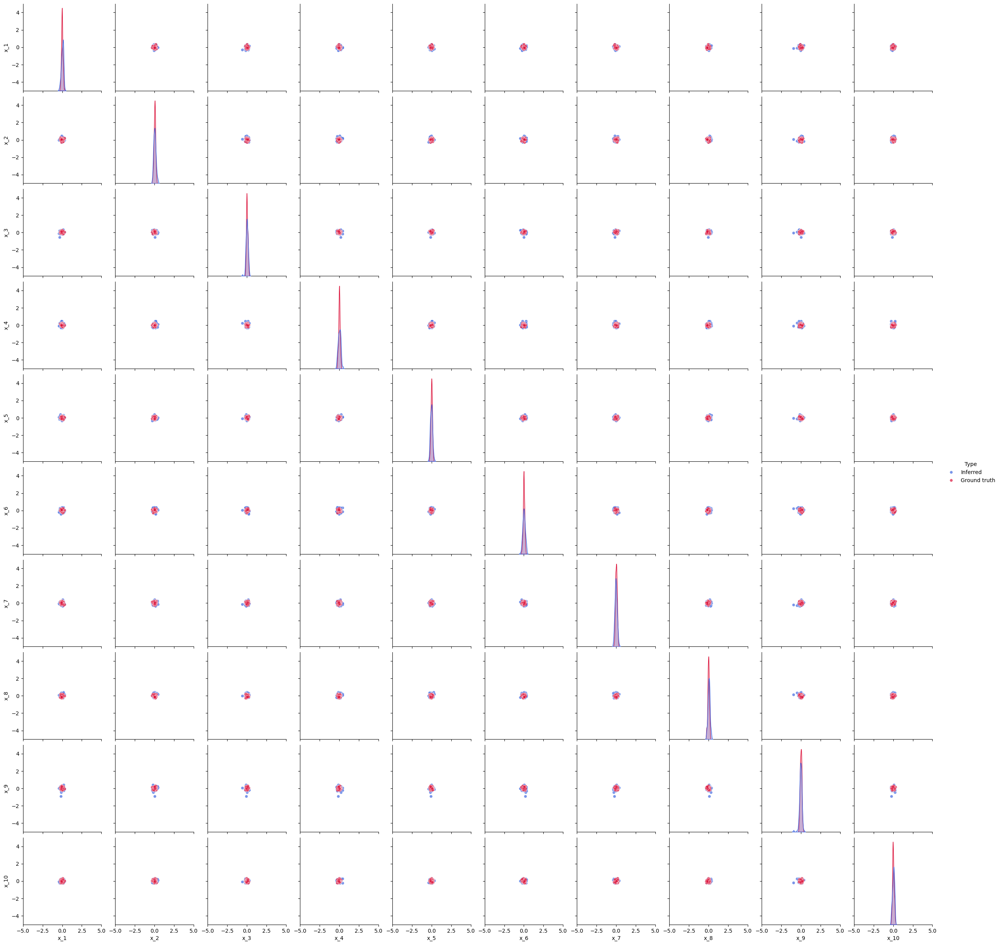

In [95]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [96]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.7449999999999999


#### budget: 100_000

In [101]:
np.random.seed(42)
torch.manual_seed(1925)

In [102]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 40
simulator_sigma_noise = 0.1
simulator_dim_y = 40
observation_nof_obs = 1

In [103]:
budget = 100000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [104]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [105]:
inference = lfi.inference.from_sbi.NPECSingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [106]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/100000 [00:00<?, ?it/s]

 Neural network successfully converged after 60 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [107]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [108]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

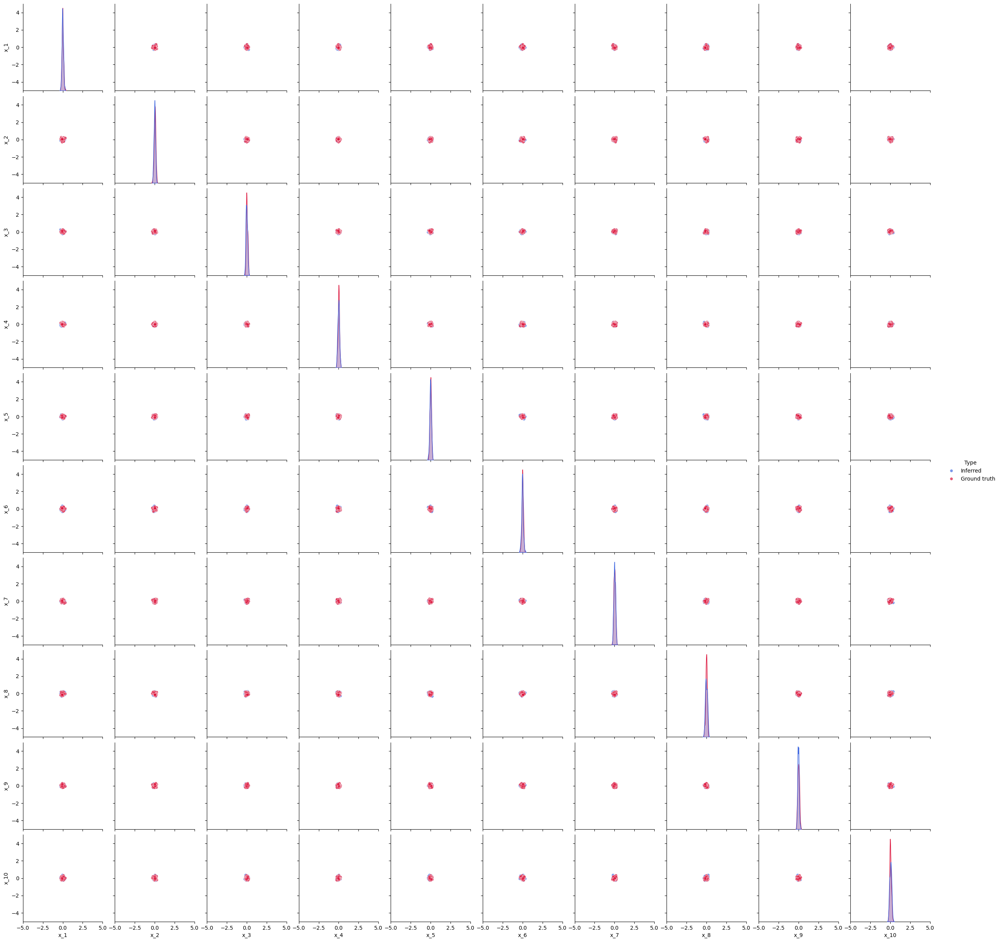

In [109]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [110]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.5549999999999999


## FMPE

### D: 2

#### budget: 1_000

In [111]:
np.random.seed(42)
torch.manual_seed(1925)

In [112]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 2
simulator_sigma_noise = 0.1
simulator_dim_y = 2
observation_nof_obs = 1

In [113]:
budget = 1000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [114]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [115]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [116]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/1000 [00:00<?, ?it/s]

 Neural network successfully converged after 291 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [117]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [118]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

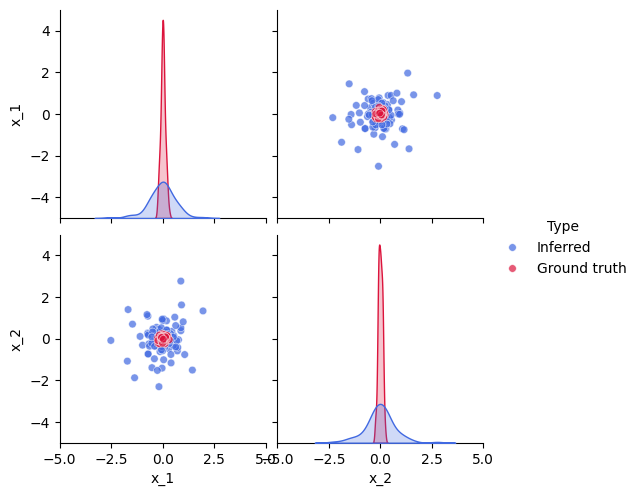

In [119]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [120]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.8949999999999999


#### budget: 5_000

In [121]:
np.random.seed(42)
torch.manual_seed(1925)

In [122]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 2
simulator_sigma_noise = 0.1
simulator_dim_y = 2
observation_nof_obs = 1

In [123]:
budget = 5000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [124]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [125]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [126]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/5000 [00:00<?, ?it/s]

 Neural network successfully converged after 85 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [127]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [128]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

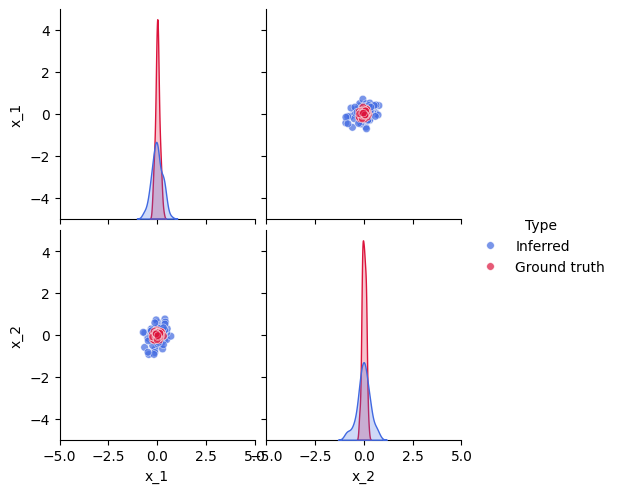

In [129]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [130]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.8149999999999998


#### budget: 10_000

In [131]:
np.random.seed(42)
torch.manual_seed(1925)

In [132]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 2
simulator_sigma_noise = 0.1
simulator_dim_y = 2
observation_nof_obs = 1

In [133]:
budget = 10_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [134]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [135]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [136]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/10000 [00:00<?, ?it/s]

 Neural network successfully converged after 67 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [137]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [138]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

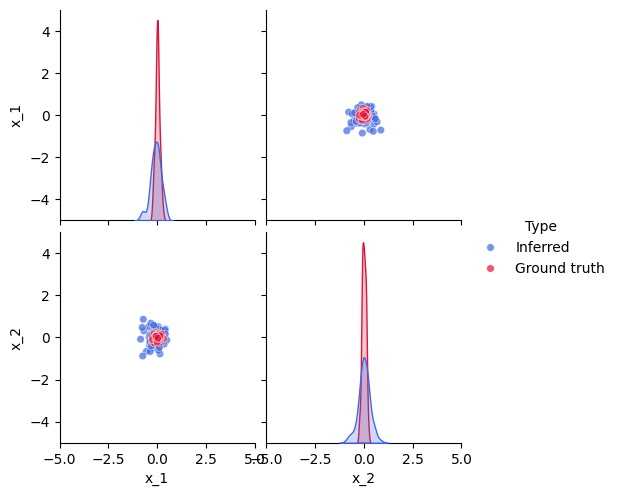

In [139]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [140]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.76


#### budget: 50_000

In [141]:
np.random.seed(42)
torch.manual_seed(1925)

In [142]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 2
simulator_sigma_noise = 0.1
simulator_dim_y = 2
observation_nof_obs = 1

In [143]:
budget = 50_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [144]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [145]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [146]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/50000 [00:00<?, ?it/s]

 Neural network successfully converged after 50 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [147]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [148]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

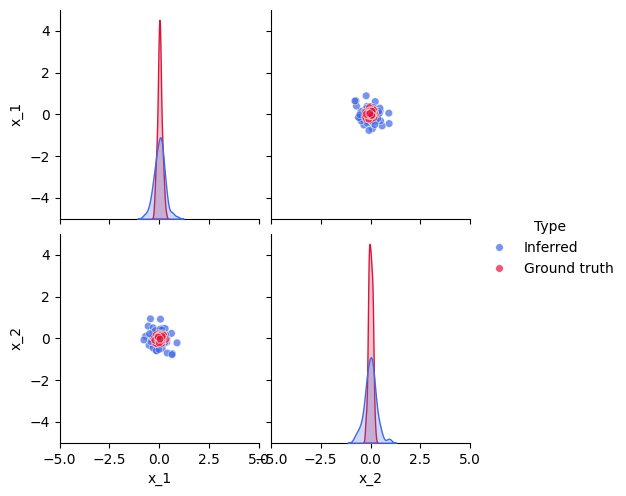

In [149]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [150]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.77


#### budget: 100_000

In [151]:
np.random.seed(42)
torch.manual_seed(1925)

In [152]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 2
simulator_sigma_noise = 0.1
simulator_dim_y = 2
observation_nof_obs = 1

In [153]:
budget = 100_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [154]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [155]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [156]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/100000 [00:00<?, ?it/s]

 Neural network successfully converged after 52 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [157]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [158]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

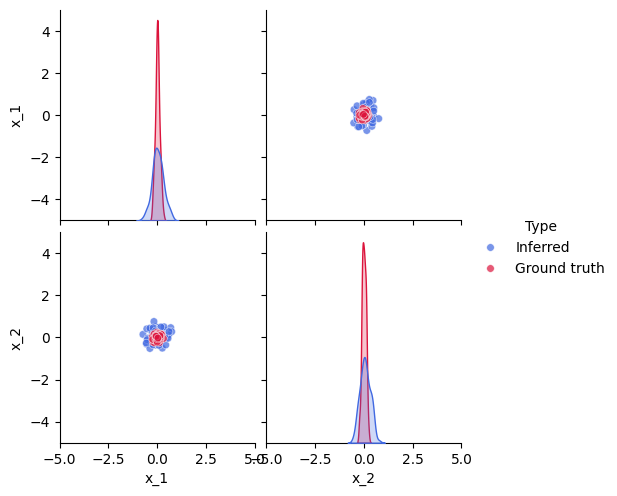

In [159]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [160]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.78


### D: 5

#### budget: 1000

In [161]:
np.random.seed(42)
torch.manual_seed(1925)

In [162]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 5
simulator_sigma_noise = 0.1
simulator_dim_y = 5
observation_nof_obs = 1

In [163]:
budget = 1000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [164]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [165]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [166]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/1000 [00:00<?, ?it/s]

 Neural network successfully converged after 258 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [167]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [168]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

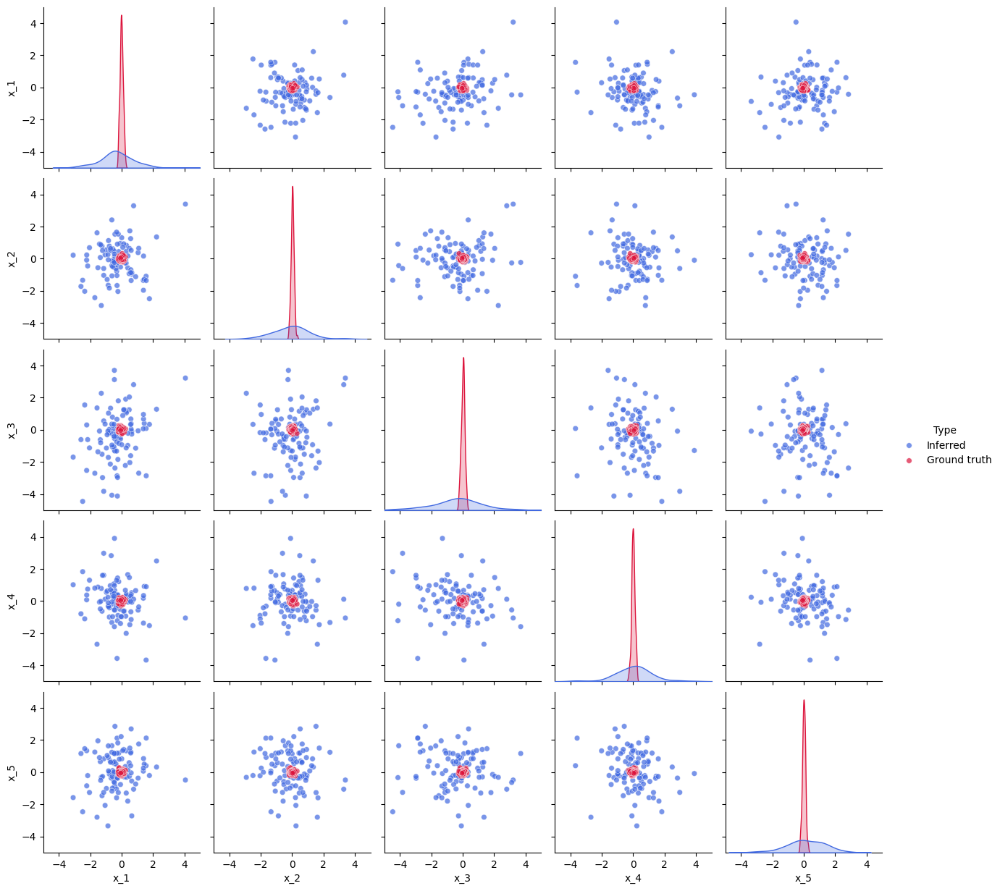

In [169]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [170]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.9800000000000001


#### budget: 5_000

In [171]:
np.random.seed(42)
torch.manual_seed(1925)

In [172]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 5
simulator_sigma_noise = 0.1
simulator_dim_y = 5
observation_nof_obs = 1

In [173]:
budget = 5_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [174]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [175]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [176]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/5000 [00:00<?, ?it/s]

 Neural network successfully converged after 118 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [177]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [178]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

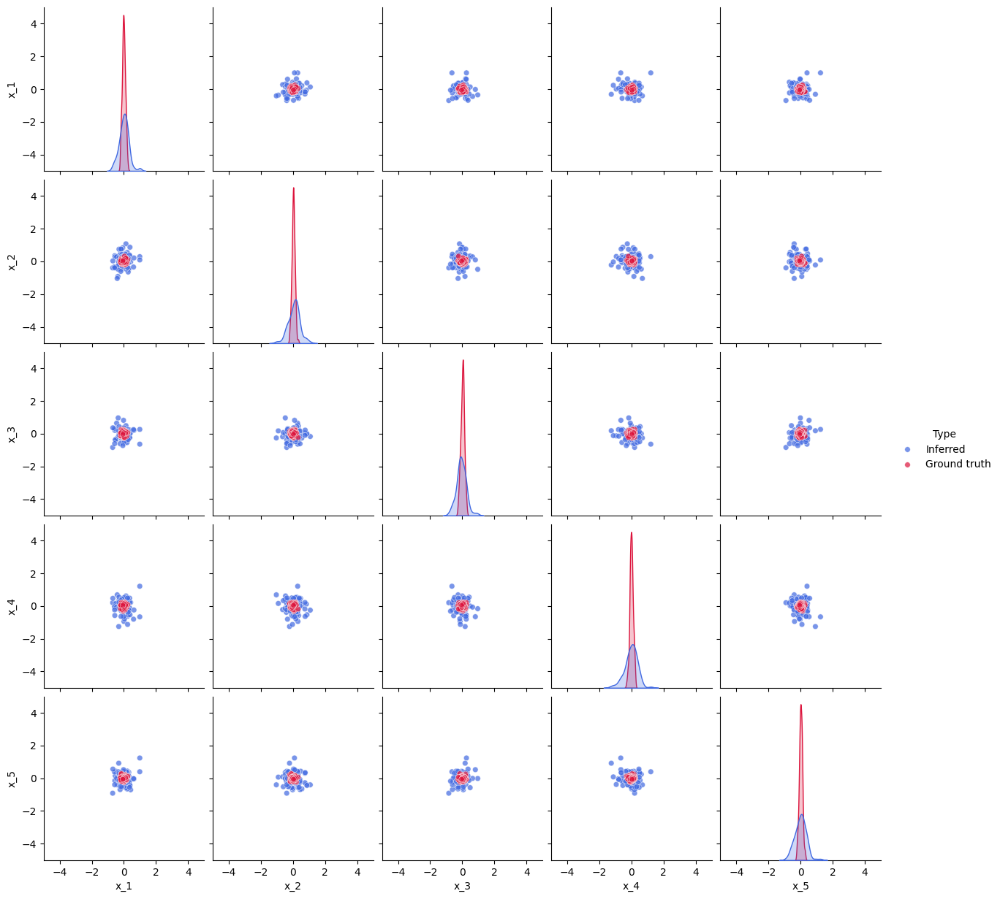

In [179]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [180]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.875


#### budget: 10_000

In [181]:
np.random.seed(42)
torch.manual_seed(1925)

In [182]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 5
simulator_sigma_noise = 0.1
simulator_dim_y = 5
observation_nof_obs = 1

In [183]:
budget = 10_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [184]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [185]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [186]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/10000 [00:00<?, ?it/s]

 Neural network successfully converged after 87 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [187]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [188]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

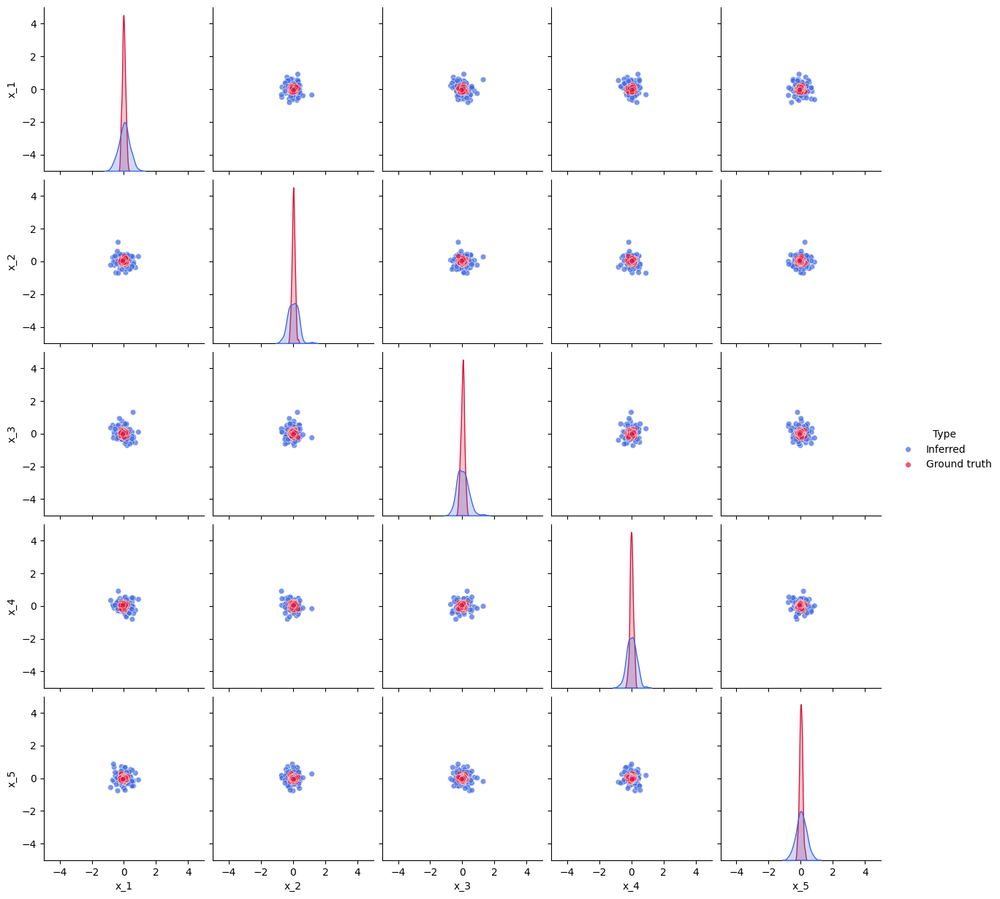

In [189]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [190]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.865


#### budget: 50_000

In [191]:
np.random.seed(42)
torch.manual_seed(1925)

In [192]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 5
simulator_sigma_noise = 0.1
simulator_dim_y = 5
observation_nof_obs = 1

In [193]:
budget = 50_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [194]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [195]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [196]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/50000 [00:00<?, ?it/s]

 Neural network successfully converged after 69 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [197]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [198]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

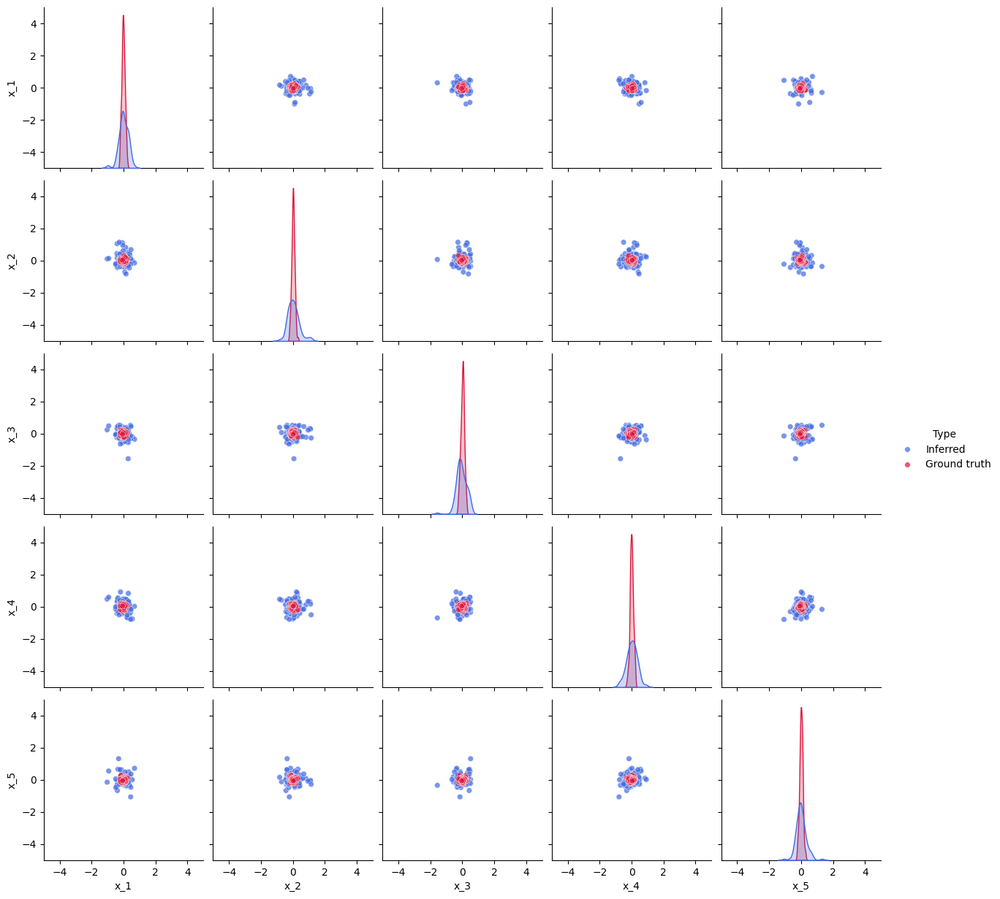

In [199]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [200]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.8949999999999999


#### budget: 100_000

In [201]:
np.random.seed(42)
torch.manual_seed(1925)

In [202]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 5
simulator_sigma_noise = 0.1
simulator_dim_y = 5
observation_nof_obs = 1

In [203]:
budget = 100_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [204]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [205]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [206]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/100000 [00:00<?, ?it/s]

 Neural network successfully converged after 83 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [207]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [208]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

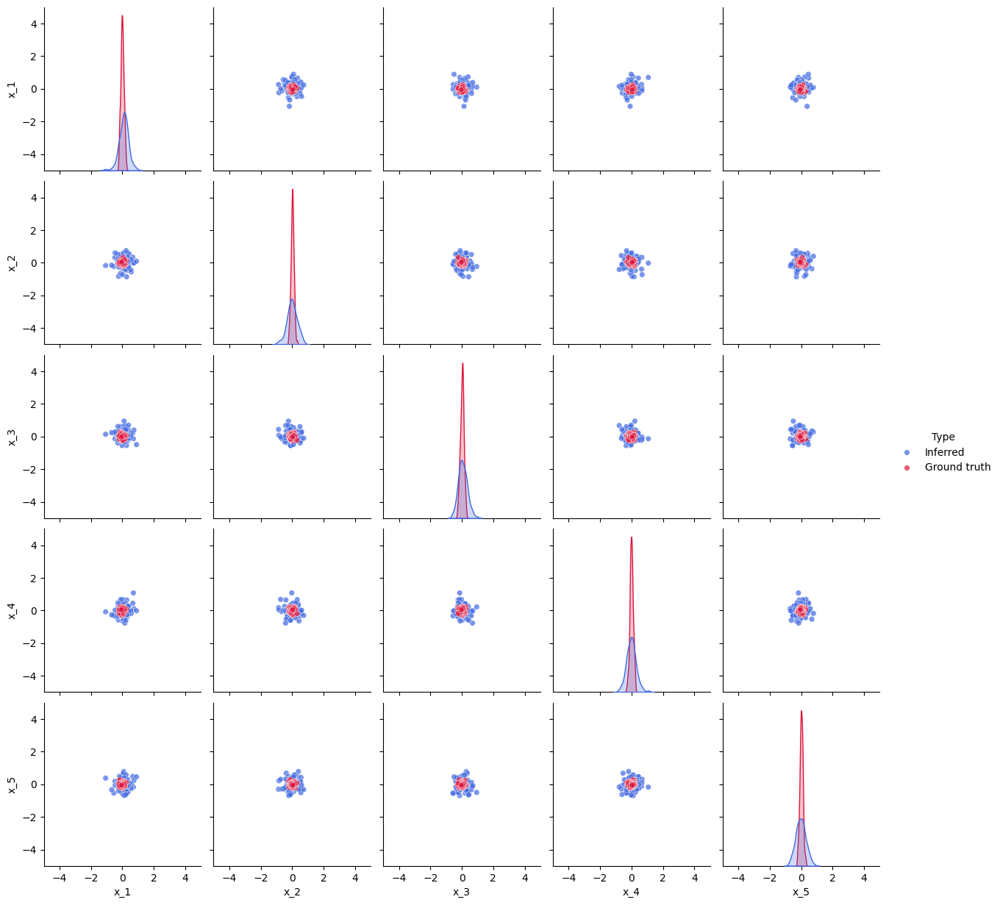

In [209]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [210]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.89


### D: 10

#### budget: 1000

In [211]:
np.random.seed(42)
torch.manual_seed(1925)

In [212]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 10
simulator_sigma_noise = 0.1
simulator_dim_y = 10
observation_nof_obs = 1

In [213]:
budget = 1000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [214]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [215]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [216]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/1000 [00:00<?, ?it/s]

 Neural network successfully converged after 392 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [217]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [218]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

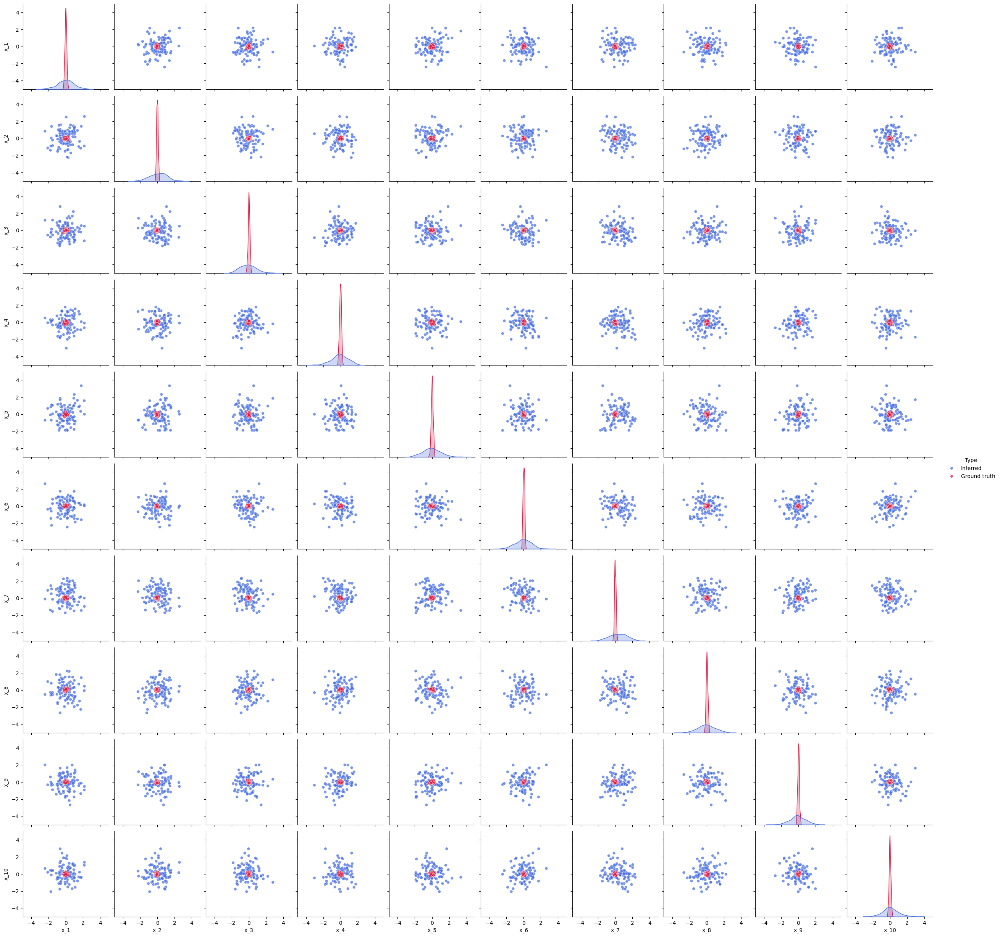

In [219]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [220]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.975


#### budget: 5_000

In [221]:
np.random.seed(42)
torch.manual_seed(1925)

In [222]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 10
simulator_sigma_noise = 0.1
simulator_dim_y = 10
observation_nof_obs = 1

In [223]:
budget = 5000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [224]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [225]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [226]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/5000 [00:00<?, ?it/s]

 Neural network successfully converged after 128 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [227]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [228]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

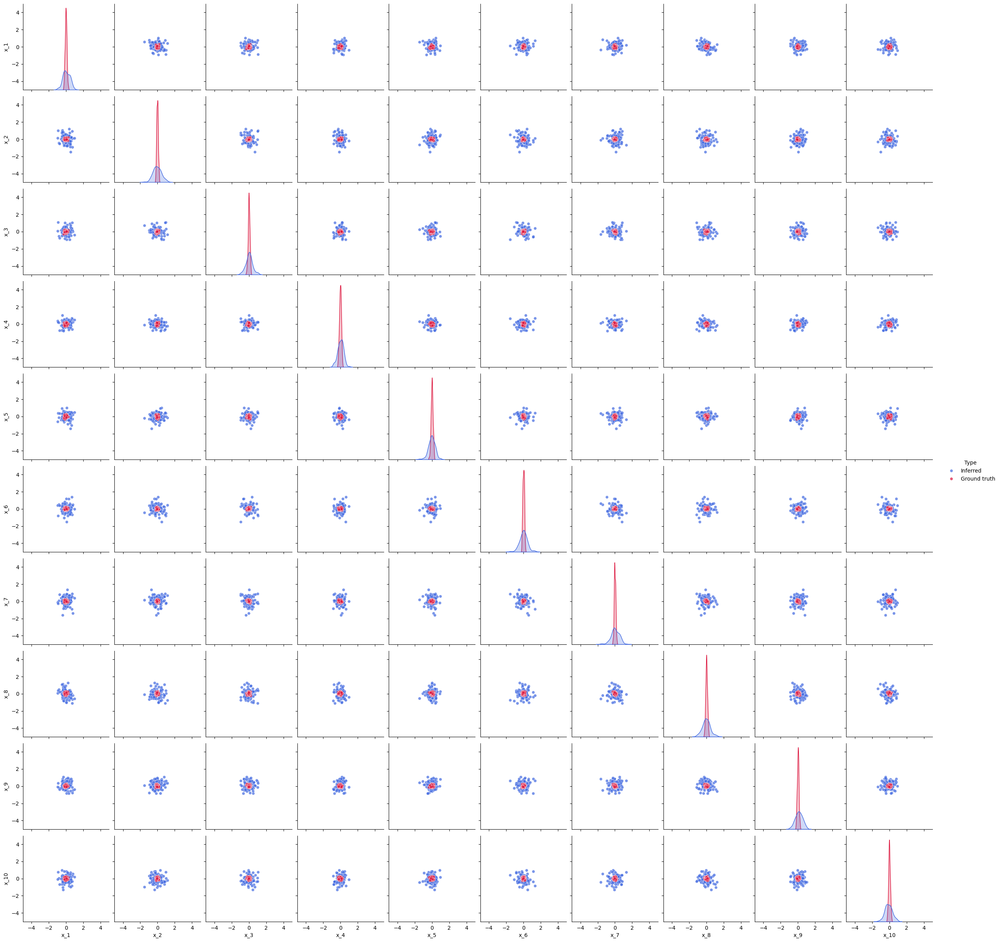

In [229]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [230]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.9549999999999998


#### budget: 10_000

In [251]:
np.random.seed(42)
torch.manual_seed(1925)

In [252]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 10
simulator_sigma_noise = 0.1
simulator_dim_y = 10
observation_nof_obs = 1

In [254]:
budget = 10000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [255]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [256]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [257]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/10000 [00:00<?, ?it/s]

 Neural network successfully converged after 166 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [258]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [259]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

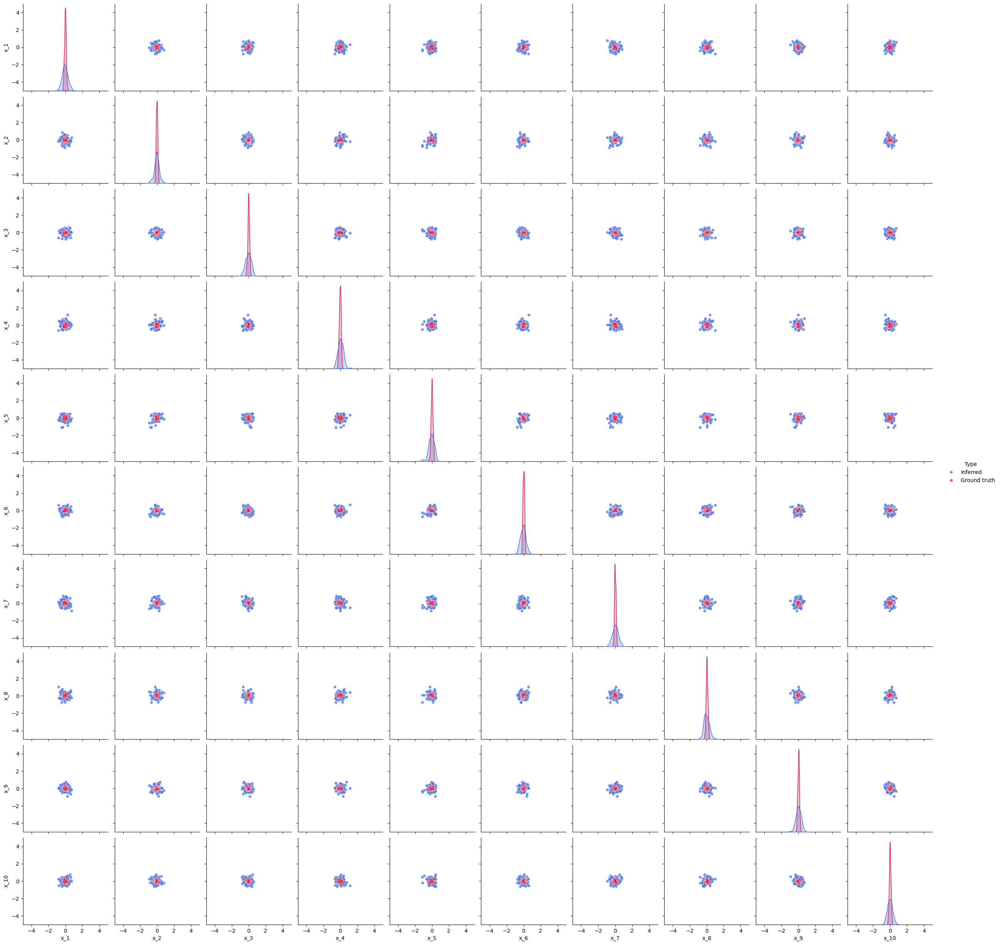

In [260]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [261]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.945


#### budget: 50_000

In [221]:
np.random.seed(42)
torch.manual_seed(1925)

In [222]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 10
simulator_sigma_noise = 0.1
simulator_dim_y = 10
observation_nof_obs = 1

In [223]:
budget = 50_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [224]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [225]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [226]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/5000 [00:00<?, ?it/s]

 Neural network successfully converged after 128 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [237]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [238]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

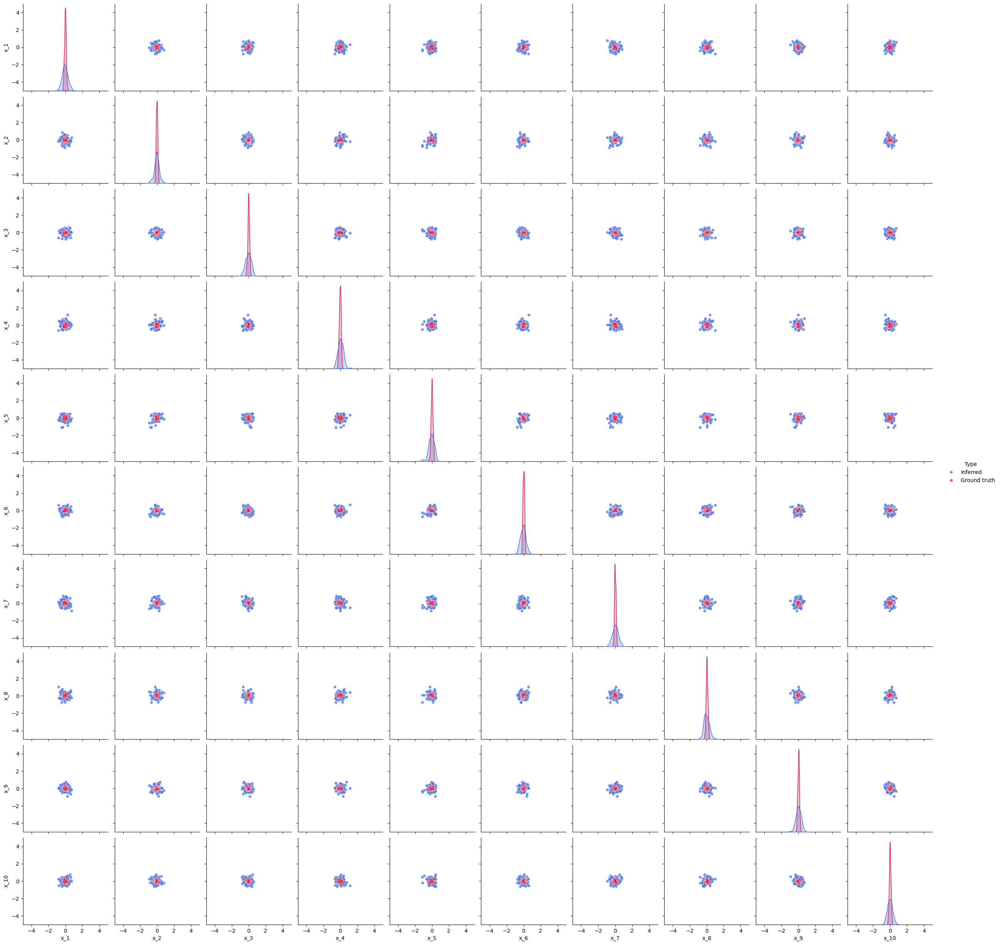

In [239]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [240]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.945


#### budget: 100_000

In [241]:
np.random.seed(42)
torch.manual_seed(1925)

In [242]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 10
simulator_sigma_noise = 0.1
simulator_dim_y = 10
observation_nof_obs = 1

In [243]:
budget = 100000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [244]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [245]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [246]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/100000 [00:00<?, ?it/s]

 Neural network successfully converged after 98 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [247]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [248]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

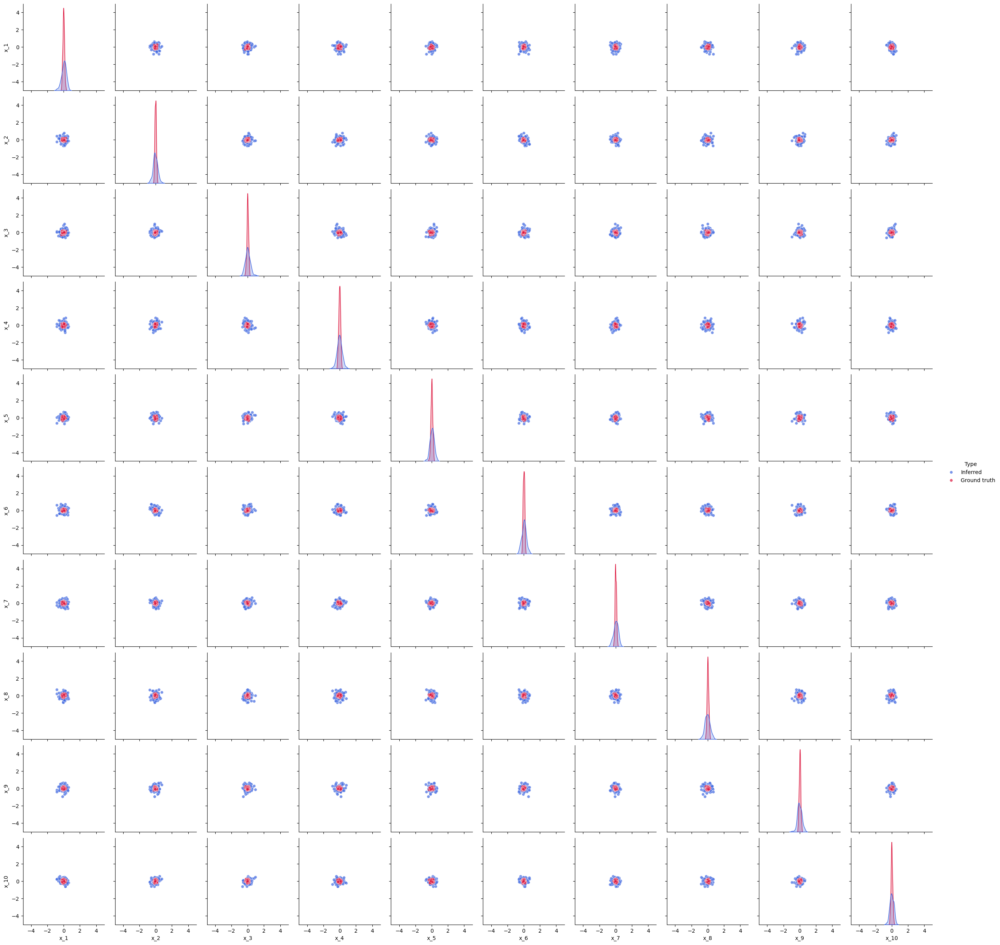

In [249]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [250]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.9450000000000001


#### budget: 200_000

In [262]:
np.random.seed(42)
torch.manual_seed(1925)

In [263]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 10
simulator_sigma_noise = 0.1
simulator_dim_y = 10
observation_nof_obs = 1

In [264]:
budget = 200_000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [265]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [266]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [267]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/200000 [00:00<?, ?it/s]

 Neural network successfully converged after 84 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [268]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [269]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

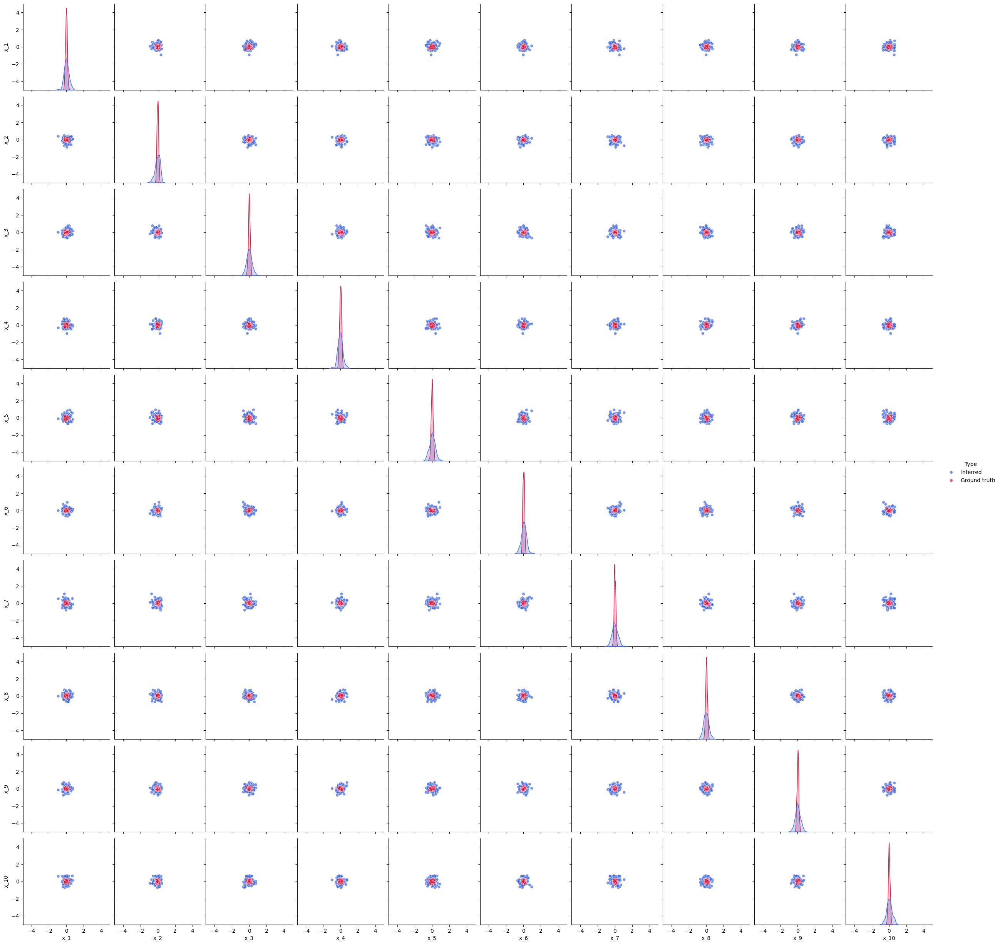

In [270]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [271]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.9550000000000001


### D: 20

#### budget: 1_000

In [272]:
np.random.seed(42)
torch.manual_seed(1925)

In [273]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 20
simulator_sigma_noise = 0.1
simulator_dim_y = 20
observation_nof_obs = 1

In [274]:
budget = 1000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [275]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [276]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [277]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/1000 [00:00<?, ?it/s]

 Neural network successfully converged after 497 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [278]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [279]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

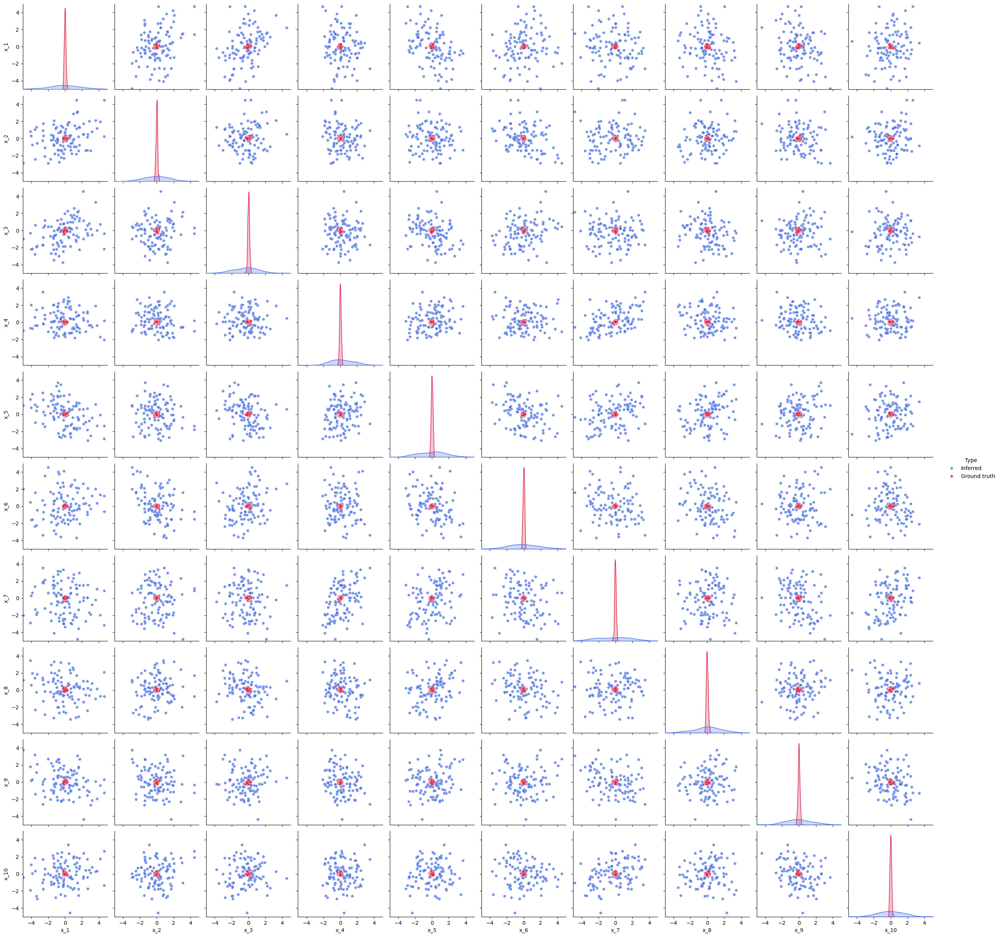

In [280]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [281]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.9949999999999999


#### budget: 5_000

In [282]:
np.random.seed(42)
torch.manual_seed(1925)

In [283]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 20
simulator_sigma_noise = 0.1
simulator_dim_y = 20
observation_nof_obs = 1

In [284]:
budget = 5000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [285]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [286]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [287]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/5000 [00:00<?, ?it/s]

 Neural network successfully converged after 302 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [288]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [289]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

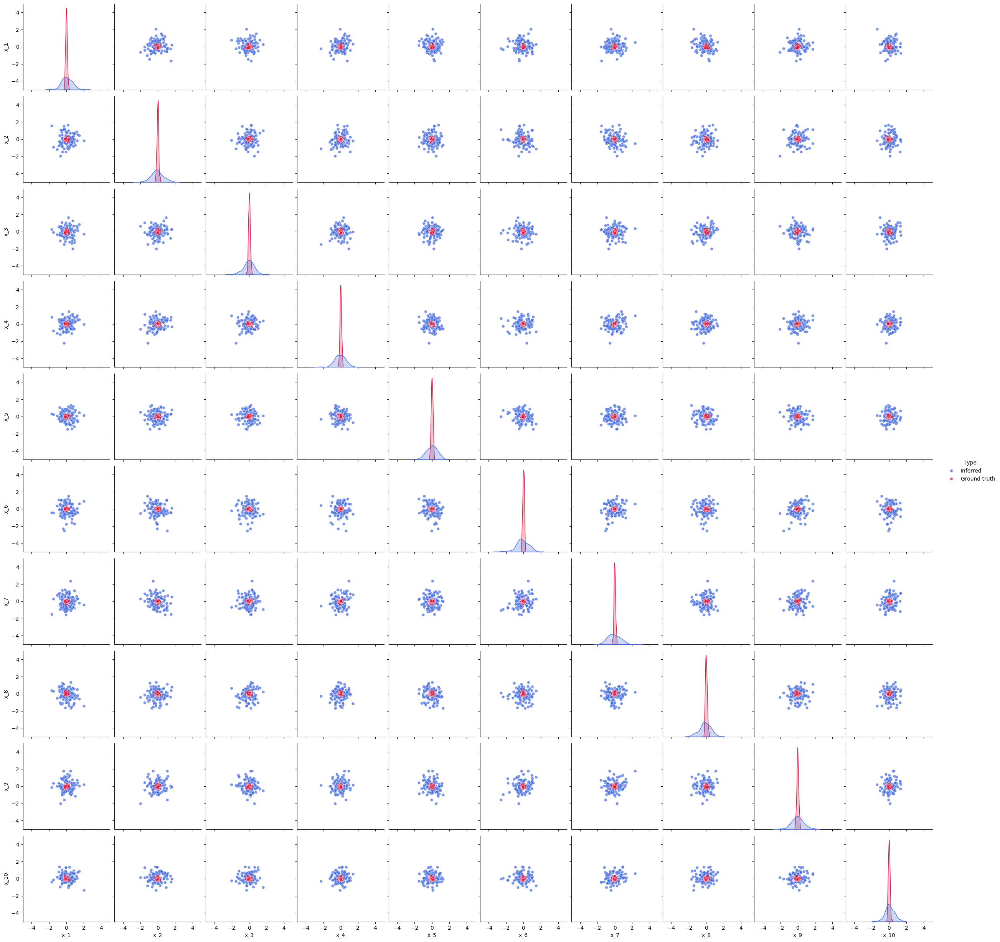

In [290]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [291]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.96


#### budget: 10_000

In [292]:
np.random.seed(42)
torch.manual_seed(1925)

In [293]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 20
simulator_sigma_noise = 0.1
simulator_dim_y = 20
observation_nof_obs = 1

In [294]:
budget = 10000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [295]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [296]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [297]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/10000 [00:00<?, ?it/s]

 Neural network successfully converged after 127 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [298]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [299]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

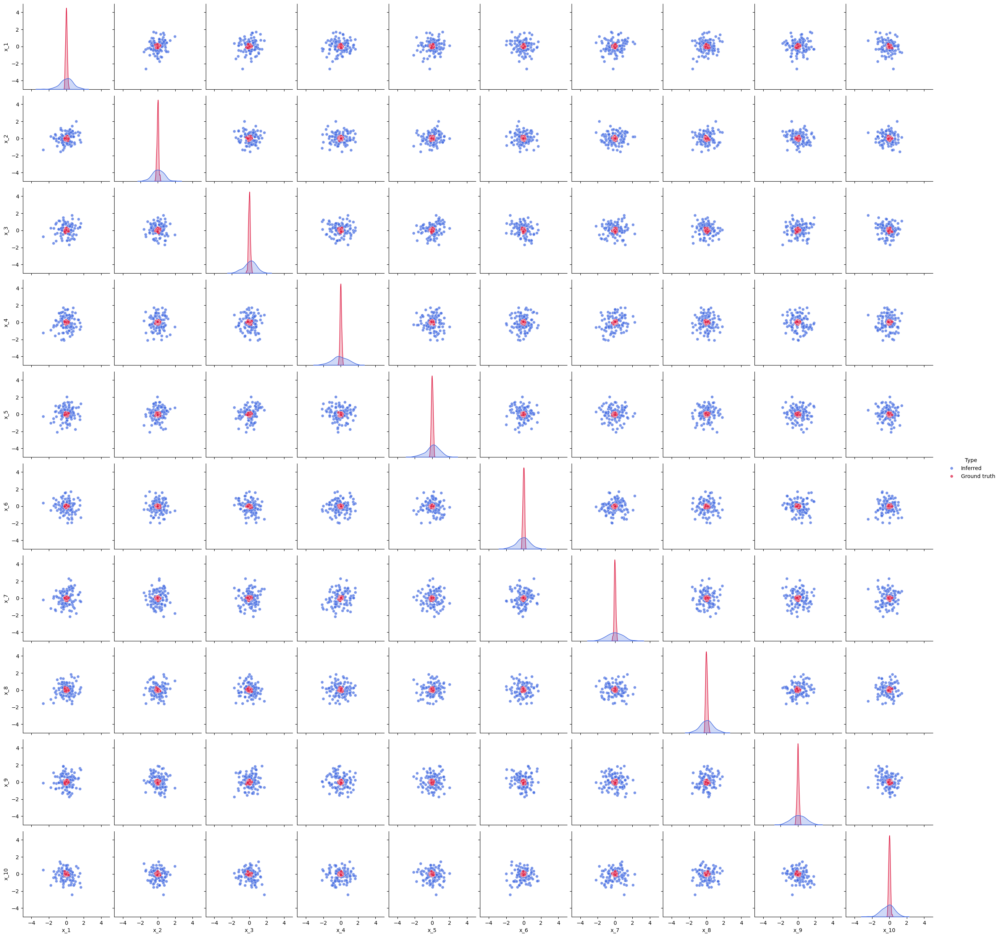

In [300]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [301]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.97


#### budget: 50_000

In [2]:
np.random.seed(42)
torch.manual_seed(1925)

In [3]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 20
simulator_sigma_noise = 0.1
simulator_dim_y = 20
observation_nof_obs = 1

In [4]:
budget = 50000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [5]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [6]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [7]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

  0%|          | 0/50000 [00:00<?, ?it/s]

 Neural network successfully converged after 260 epochs.

DirectPosterior sampler for potential_fn=<PosteriorBasedPotential>

In [8]:
samples = inference.sample(nof_samples=nof_samples)

Drawing 100 posterior samples:   0%|          | 0/100 [00:00<?, ?it/s]

In [9]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

<Figure size 640x480 with 0 Axes>

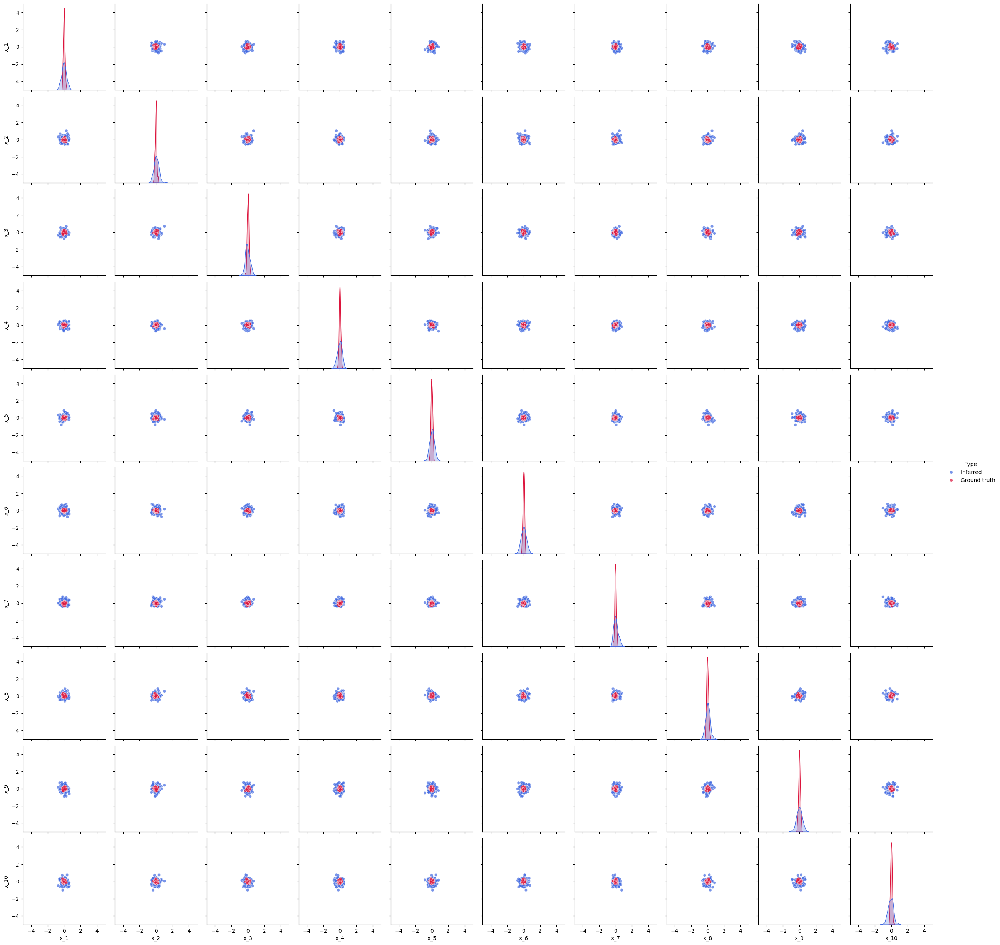

In [10]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [11]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

c2st is: 0.9199999999999999


#### budget: 100_000

In [ ]:
np.random.seed(42)
torch.manual_seed(1925)

In [ ]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 20
simulator_sigma_noise = 0.1
simulator_dim_y = 20
observation_nof_obs = 1

In [ ]:
budget = 100000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [ ]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [ ]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [ ]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

In [ ]:
samples = inference.sample(nof_samples=nof_samples)

In [ ]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

In [ ]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [ ]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

### D: 30

#### budget: 1000

In [ ]:
np.random.seed(42)
torch.manual_seed(1925)

In [ ]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [ ]:
budget = 1000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [ ]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [ ]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [ ]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

In [ ]:
samples = inference.sample(nof_samples=nof_samples)

In [ ]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

In [ ]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [ ]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

#### budget: 5000

In [ ]:
np.random.seed(42)
torch.manual_seed(1925)

In [ ]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [ ]:
budget = 5000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [ ]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [ ]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [ ]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

In [ ]:
samples = inference.sample(nof_samples=nof_samples)

In [ ]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

In [ ]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [ ]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")

#### budget:10_000

In [ ]:
np.random.seed(42)
torch.manual_seed(1925)

In [ ]:
# modeling parameters
prior_low = -5
prior_high = 5
prior_dim = 30
simulator_sigma_noise = 0.1
simulator_dim_y = 30
observation_nof_obs = 1

In [ ]:
budget = 10000
batch_size = 1_000
max_num_epochs = 1_000
nof_samples = 100

In [ ]:
prior = lfi.priors.UniformPrior(low=prior_low, high=prior_high, dim=prior_dim)
simulator = lfi.simulators.GaussianNoise(dim=prior_dim, dim_y=simulator_dim_y, sigma_noise=simulator_sigma_noise)
obs = lfi.observations.Zeros(dim_y = simulator_dim_y, nof_observations=observation_nof_obs)
observation = obs.sample()


In [ ]:
inference = lfi.inference.from_sbi.FMPESingleRound(
    prior=prior,
    simulator=simulator,
    observation=observation
)

In [ ]:
inference.fit(
    budget=budget,
    fit_kwargs = {
        "batch_size": batch_size,
    }
)

In [ ]:
samples = inference.sample(nof_samples=nof_samples)

In [ ]:
ground_truth = lfi.ground_truth.Gaussian(dim=prior_dim, mu = 0, sigma=simulator_sigma_noise)
samples_gt = ground_truth.sample(nof_samples=nof_samples)

In [ ]:
lfi.visualization.plot_pairwise_posterior(
    samples,
    limits = [prior_low, prior_high],
    samples_gt = samples_gt
)

In [ ]:
c2st = lfi.evaluation.c2st(samples, samples_gt)
print(f"c2st is: {c2st}")